# 2015 St. Patrick's Day storm — evaluation figures

Test di generalizzazione fuori distribuzione sulla tempesta geomagnetica del 17 marzo 2015
(Dst<sub>min</sub> &asymp; &minus;223 nT, la piu' intensa del Solar Cycle 24). E' un test particolarmente
rilevante per la generalizzabilita' del modello per quattro motivi:

- e' un evento **out-of-distribution**: il modello e' stato addestrato sul periodo 2020&ndash;2025 e non ha mai visto
  una tempesta di questa intensita';
- i dati L1 di conditioning sono di **ACE**, non DSCOVR (usato nel training) &mdash; DSCOVR non era ancora
  operativo nel 2015, quindi cambia anche la sorgente strumentale del driver di vento solare;
- il 2015 appartiene a un **ciclo solare diverso** (Solar Cycle 24) rispetto al periodo di training;
- il rollout autoregressivo e' molto piu' lungo del solito: **circa 2&ndash;2.5 giorni** (fino a 1911 frame),
  contro i pochi step tipici della validazione standard.


In [1]:
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from IPython.display import display, Image
import os, json

plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

def show(fig, name):
    path = f'/tmp/{name}'
    fig.savefig(path, bbox_inches='tight', dpi=150)
    plt.close(fig)
    display(Image(path))

CSV_PATH = '/users/framunno/data/ionosphere/l1_to_map_matched_2015_march_10_20_deduplicated.csv'
MAPS_DIR = '/users/framunno/data_2015/maps'
BASE     = '/capstor/scratch/cscs/framunno'
METRICS_BASE = '/users/framunno/res_iono/metrics_2015'
PAPER_FIGURES_DIR = '/users/framunno/projects/paper_writing/SuperDARN_deep_Learning_Francesco/figures'
os.makedirs(PAPER_FIGURES_DIR, exist_ok=True)

PRED_TAGS   = ['2015-03-16T04h34', '2015-03-16T19h52', '2015-03-17T06h00']
TAG_COLORS  = ['#2a78d6', '#eb6834', '#1baf7a']
MODEL_ORDER = ['CLASSIC', 'NOCOND', 'UNET', 'PERSISTENCE']
MODEL_COLORS = {'CLASSIC': '#2a78d6', 'NOCOND': '#eb6834', 'UNET': '#1baf7a', 'PERSISTENCE': '#7a7a76'}
COND_FRAMES, FRAME_DT, NORM_SCALE = 15, 2, 80000

pred_starts = {tag: pd.Timestamp(tag.replace('T', ' ').replace('h', ':'), tz='UTC') for tag in PRED_TAGS}
cond_starts = {tag: t - pd.Timedelta(minutes=COND_FRAMES * FRAME_DT) for tag, t in pred_starts.items()}


In [2]:
# =============================================================================
# Ground truth: statistiche per-frame su tutte le mappe 10-20 marzo 2015
# =============================================================================
df = pd.read_csv(CSV_PATH)
df['time_map'] = pd.to_datetime(df['time_map'], utc=True)
df = df.sort_values('time_map').reset_index(drop=True)

records = []
for _, row in df.iterrows():
    fpath = os.path.join(MAPS_DIR, row['filename'])
    if not os.path.exists(fpath):
        continue
    img = np.load(fpath, allow_pickle=True)[0].astype(np.float32)
    p75, p25 = np.percentile(img, 75), np.percentile(img, 25)
    records.append({
        'time': row['time_map'], 'mean': float(np.mean(img)), 'std': float(np.std(img)),
        'min': float(np.min(img)), 'max': float(np.max(img)),
        'range': float(np.max(img) - np.min(img)), 'absmax': float(np.max(np.abs(img))),
        'cpcp': float(p75 - p25),
    })
stats = pd.DataFrame(records).set_index('time').sort_index()
print(f'Frames loaded: {len(stats)}')


Frames loaded: 7493


## Figura 1 &mdash; dato reale (GT) con le finestre di predizione

Statistiche per-frame della mappa di potenziale ionosferico osservata, sull'intero periodo che copre
le tre finestre di generazione. Le linee verticali tratteggiate segnano i tre `PRED_START` usati in
generazione (16 mar 04:34, 16 mar 19:52, 17 mar 06:00); l'area ombreggiata e' la finestra di
conditioning (15 frame / 30 min) immediatamente precedente. La terza finestra (verde) cade esattamente
sull'onset della fase intensa della tempesta: si vede il salto netto in tutte e 4 le statistiche subito
dopo il marker.


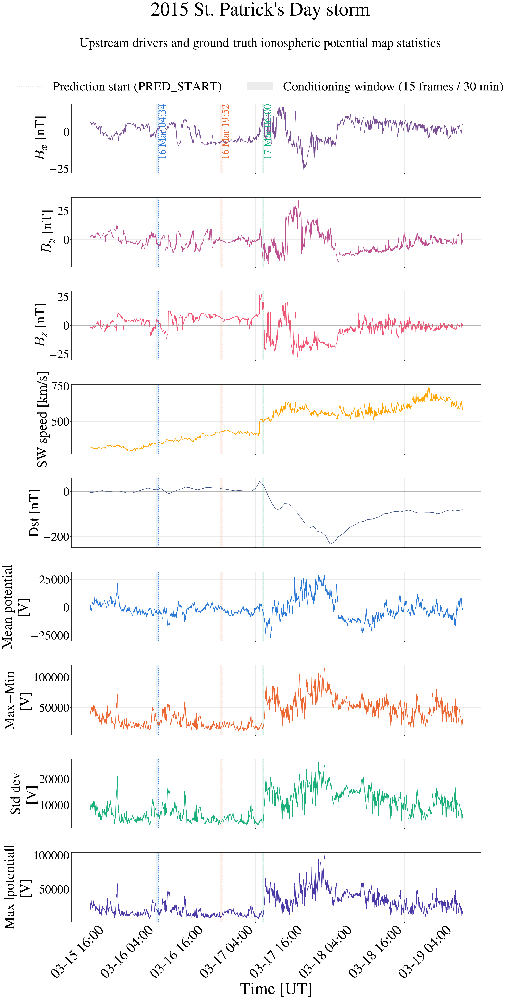

In [3]:
# =============================================================================
# Figure 1 (expanded): upstream drivers (IMF Bx/By/Bz, SW speed, Dst) + ground-truth potential stats
# =============================================================================
pairs = [
    ('mean',   'Mean potential\n[V]',  '#2a78d6'),
    ('range',  'Max' + chr(0x2212) + 'Min\n[V]', '#eb6834'),
    ('std',    'Std dev\n[V]',         '#1baf7a'),
    ('absmax', 'Max |potential|\n[V]', '#4a3aa7'),
]

dst_df = pd.read_csv('/users/framunno/data/ionosphere/omni2_dst_2015_march.csv')
dst_df['time_utc'] = pd.to_datetime(dst_df['time_utc'], utc=True)
dst_df = dst_df.set_index('time_utc').sort_index()

l1 = df.set_index('time_map')[['bx_gsm', 'by_gsm', 'bz_gsm', 'speed_kms']].sort_index()

WIN_START, WIN_END = '2015-03-15 12:00', '2015-03-19 06:00'

context_pairs = [
    ('bx',     '$B_x$ [nT]',                l1['bx_gsm'],       '#7a5195'),
    ('by',     '$B_y$ [nT]',                l1['by_gsm'],       '#bc5090'),
    ('bz',     '$B_z$ [nT]',                l1['bz_gsm'],       '#ef5675'),
    ('speed',  'SW speed [km/s]',           l1['speed_kms'],    '#ffa600'),
    ('dst',    'Dst [nT]',                  dst_df['dst_nT'],   '#374c80'),
] + [(col, ylabel, stats[col], color) for col, ylabel, color in pairs]

fig, axes = plt.subplots(len(context_pairs), 1, figsize=(20, 42), sharex=True, dpi=300,
                          gridspec_kw={'hspace': 0.35})

for ax, (col, ylabel, series, color) in zip(axes, context_pairs):
    s = series[(series.index >= WIN_START) & (series.index <= WIN_END)]
    ax.plot(s.index, s.values, lw=1.4, color=color)
    ax.set_ylabel(ylabel, fontsize=44)
    ax.tick_params(axis='y', labelsize=38)
    ax.grid(alpha=0.3)
    if col in ('bz', 'dst'):
        ax.axhline(0, color='gray', lw=1.2, alpha=0.5)
    for tag, tcolor in zip(PRED_TAGS, TAG_COLORS):
        ax.axvline(pred_starts[tag], color=tcolor, lw=2.6, ls=':', alpha=0.9)
        ax.axvspan(cond_starts[tag], pred_starts[tag], color=tcolor, alpha=0.10)

for tag, tcolor in zip(PRED_TAGS, TAG_COLORS):
    axes[0].text(pred_starts[tag], axes[0].get_ylim()[1], pred_starts[tag].strftime('%d %b %H:%M'),
                 rotation=90, va='top', ha='left', fontsize=32, color=tcolor)

axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
axes[-1].xaxis.set_major_locator(mdates.HourLocator(interval=12))
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=44)
axes[-1].set_xlabel('Time [UT]', fontsize=52)

legend_elements = [Line2D([0], [0], color='gray', lw=2.6, ls=':', label='Prediction start (PRED' + chr(0x5f) + 'START)'),
                    Patch(facecolor='gray', alpha=0.15, label='Conditioning window (15 frames / 30 min)')]

fig.subplots_adjust(top=0.89, hspace=0.35, left=0.09, right=0.98, bottom=0.045)
fig.text(0.5, 0.995, "2015 St. Patrick" + chr(0x27) + "s Day storm", fontsize=60, ha='center', va='top')
fig.text(0.5, 0.958, "Upstream drivers and ground-truth ionospheric potential map statistics", fontsize=40, ha='center', va='top')
fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.925), ncol=2, fontsize=40, frameon=False)
fig.savefig(os.path.join(PAPER_FIGURES_DIR, 'storm2015_gt_predstarts.png'), bbox_inches='tight', dpi=300)
show(fig, '2015_fig1_gt_predstarts.png')


## Figura 2 &mdash; confronto per modello (NOCOND &rarr; UNET &rarr; diffusione)

Per ciascun modello, statistiche GT (nero) vs previsione (colorata per finestra) lungo l'intero
rollout. Le tre finestre sono mostrate separatamente per ogni modello cosi' da poter discutere il
comportamento di ciascuno individualmente.


In [4]:
# =============================================================================
# Carica le predizioni dei 3 modelli per le 3 finestre
# =============================================================================
def load_pred_stats(tag, model_name):
    d = f"{BASE}/results_2015_{model_name}_AR50_pred{tag}"
    pred_path = os.path.join(d, 'generated_imgs', 'pred_0.npy')
    meta_path = os.path.join(d, 'metadata', 'meta_0.json')
    if not os.path.exists(pred_path):
        return None
    meta = json.load(open(meta_path))
    pred = np.load(pred_path, allow_pickle=True).astype(np.float32) * NORM_SCALE
    if pred.ndim == 3:
        pred = pred[np.newaxis]
    n_samples, n_frames = pred.shape[:2]
    pred_start = pred_starts[tag]
    cond_start = cond_starts[tag]
    times = [pred_start + pd.Timedelta(minutes=FRAME_DT * i) for i in range(n_frames)]

    stat = {
        'mean':   pred.mean(axis=(-2, -1)),
        'range':  pred.max(axis=(-2, -1)) - pred.min(axis=(-2, -1)),
        'std':    pred.std(axis=(-2, -1)),
        'absmax': np.abs(pred).max(axis=(-2, -1)),
    }
    mu  = {k: v.mean(axis=0) for k, v in stat.items()}
    sig = {k: v.std(axis=0)  for k, v in stat.items()}
    return {'times': times, 'pred_start': pred_start, 'cond_start': cond_start,
            'mu': mu, 'sig': sig, 'n_samples': n_samples}

all_data = {}
for tag in PRED_TAGS:
    for m in ['CLASSIC', 'NOCOND', 'UNET']:
        res = load_pred_stats(tag, m)
        if res:
            all_data[(tag, m)] = res
            print(f"[{m} {tag}] {res['n_samples']} samples, {len(res['times'])} frames")


[CLASSIC 2015-03-16T04h34] 3 samples, 1911 frames


[NOCOND 2015-03-16T04h34] 3 samples, 1911 frames


[UNET 2015-03-16T04h34] 1 samples, 1911 frames


[CLASSIC 2015-03-16T19h52] 3 samples, 1463 frames


[NOCOND 2015-03-16T19h52] 3 samples, 1463 frames


[UNET 2015-03-16T19h52] 1 samples, 1463 frames


[CLASSIC 2015-03-17T06h00] 3 samples, 1162 frames


[NOCOND 2015-03-17T06h00] 3 samples, 1162 frames
[UNET 2015-03-17T06h00] 1 samples, 1162 frames


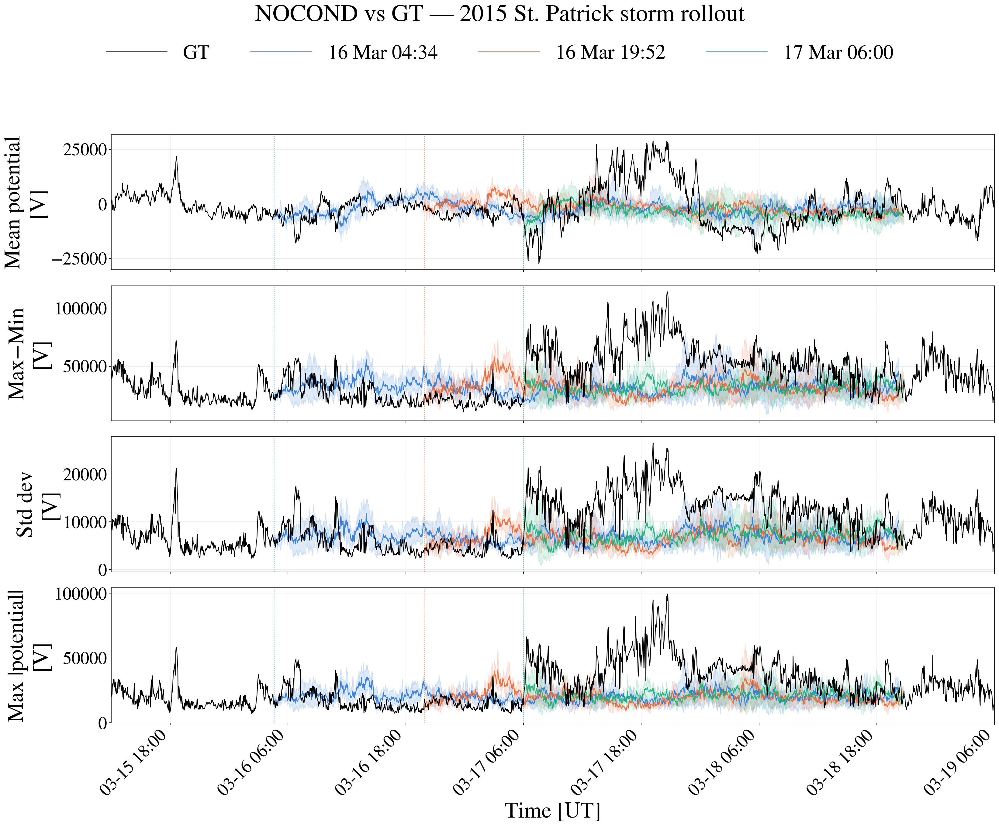

In [5]:
def plot_model_panel(model_name):
    fig, axes = plt.subplots(len(pairs), 1, figsize=(22, 16), sharex=True, dpi=300)
    for ax, (col, ylabel, _) in zip(axes, pairs):
        ax.plot(stats.index, stats[col], color='black', lw=1.2, label='GT', zorder=5)
        for tag, tcolor in zip(PRED_TAGS, TAG_COLORS):
            key = (tag, model_name)
            if key not in all_data:
                continue
            d = all_data[key]
            ax.plot(d['times'], d['mu'][col], color=tcolor, lw=1.3, alpha=0.9,
                    label=pred_starts[tag].strftime('%d %b %H:%M'))
            if d['n_samples'] > 1:
                mu_, sig_ = np.array(d['mu'][col]), np.array(d['sig'][col])
                ax.fill_between(d['times'], mu_ - sig_, mu_ + sig_, color=tcolor, alpha=0.15)
            ax.axvline(d['pred_start'], color=tcolor, lw=1.2, ls=':', alpha=0.7)
        ax.set_ylabel(ylabel, fontsize=35)
        ax.tick_params(labelsize=28)
        ax.grid(alpha=0.25)

    axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
    axes[-1].xaxis.set_major_locator(mdates.HourLocator(interval=12))
    plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=28)
    axes[-1].set_xlabel('Time [UT]', fontsize=35)
    axes[0].set_xlim(pd.Timestamp('2015-03-15 12:00', tz='UTC'), pd.Timestamp('2015-03-19 06:00', tz='UTC'))

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, fontsize=32, frameon=False, handlelength=3)
    fig.suptitle(f'{model_name} vs GT ' + chr(0x2014) + ' 2015 St. Patrick storm rollout', fontsize=38, y=1.13)
    plt.tight_layout()
    fig.savefig(os.path.join(PAPER_FIGURES_DIR, f'storm2015_model_{model_name.lower()}.png'), bbox_inches='tight', dpi=300)
    show(fig, f'2015_fig2_{model_name}.png')

plot_model_panel('NOCOND')


**NOCOND** e' la variante addestrata senza conditioning sul mapping L1 (flag `--no-mapping-cond`): il
modello autoregressivo vede solo la propria storia di frame ionosferici, non il driver di vento
solare. Nelle due finestre pre-tempesta (16 marzo, blu/arancio) NOCOND segue la GT ragionevolmente
bene &mdash; in condizioni quiete l'autocorrelazione della sola mappa e' un proxy accettabile. Ma alla
terza finestra (17 marzo 06:00, verde), che cade esattamente sull'onset della fase intensa, NOCOND
resta **completamente piatto**: mean/range/std/max|V| restano ai livelli pre-tempesta per tutto il
rollout, mentre la GT esplode (range da ~20&ndash;30 kV a 80&ndash;110 kV). Senza poter "vedere" il
driver esterno il modello non ha alcuna informazione per anticipare l'intensificazione: e' cieco alla
tempesta per costruzione, non per un limite di capacita'.


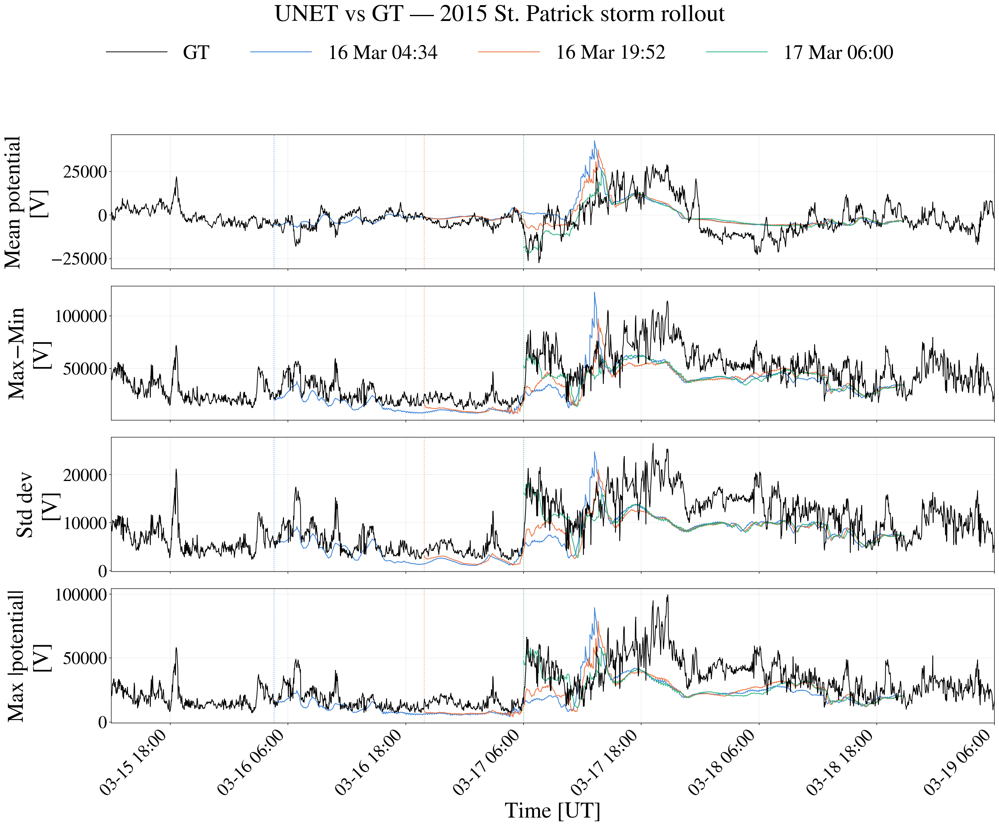

In [6]:
plot_model_panel('UNET')


**UNET** (deterministico, con conditioning) invece **reagisce correttamente** all'onset: tutte e tre
le finestre mostrano un salto ben sincronizzato con la GT subito dopo il 17 marzo 06:00, e la finestra
blu (16 mar 04:34, che attraversa l'intero evento) segue perfino la forma del picco di ampiezza tra il
17 e il 18 marzo. Il problema emerge piu' avanti nel rollout: essendo un regressore deterministico
senza componente stocastica, ogni step autoregressivo restituisce la previsione "piu' probabile" (una
media), che viene ri-alimentata come input allo step successivo. Su un rollout di 1&ndash;2 giorni
questo produce uno **smoothing progressivo** &mdash; dopo il picco iniziale (17 mar 12:00&ndash;18:00
circa) l'ampiezza di UNET collassa verso una traiettoria via via piu' liscia e piatta, perdendo la
variabilita' ad alta frequenza che la GT mantiene fino al 19 marzo. Il modello "sa" che sta arrivando
una tempesta ma non riesce a sostenerne la turbolenza a lungo termine.


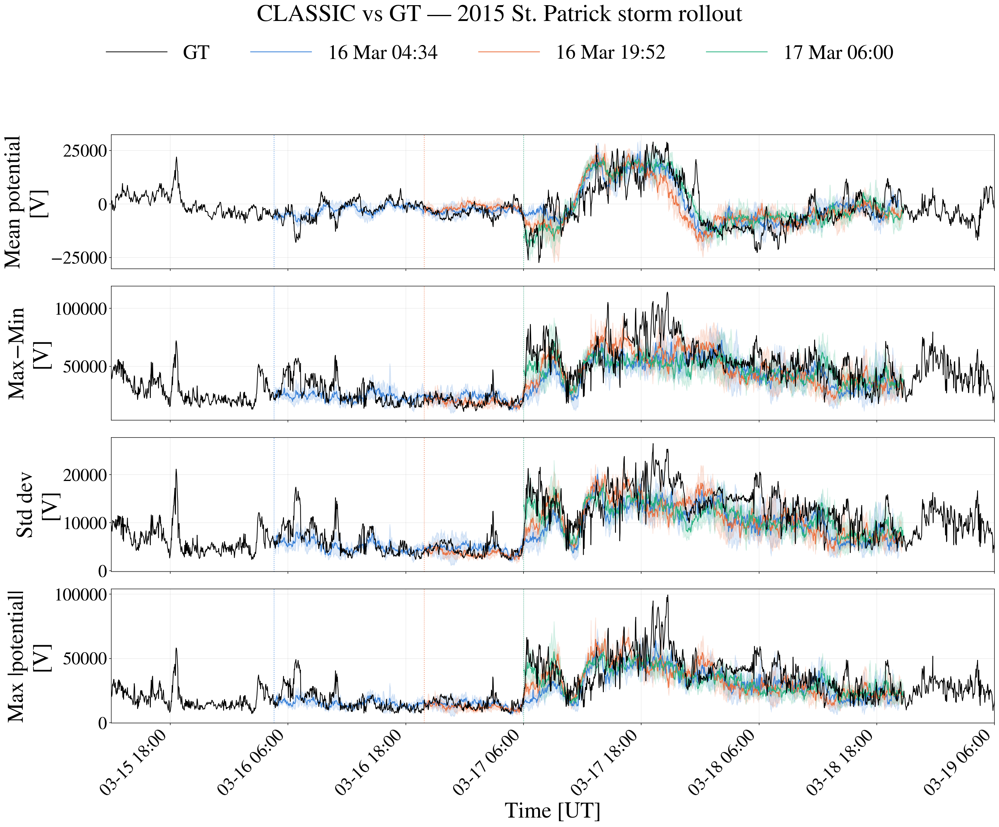

In [7]:
plot_model_panel('CLASSIC')


**CLASSIC** (diffusion, con conditioning) combina i vantaggi di entrambi: reagisce all'onset come
UNET, ma grazie al sampling stocastico ad ogni step autoregressivo rigenera dettaglio ad alta
frequenza plausibile invece di collassare verso una media. Il risultato e' che la curva CLASSIC segue
la GT non solo nel salto iniziale ma anche nella fase di recovery (18&ndash;19 marzo), restando entro
la banda &plusmn;1 sample-std per quasi tutto il rollout di ~2.5 giorni &mdash; una generalizzazione
notevole per un evento completamente fuori dal training set.


## Figura qualitativa &mdash; mappe reali GT / NOCOND / UNET / CLASSIC lungo il rollout

Confronto visivo diretto: una riga per GT e per ciascun modello, una colonna per ciascuno di 5 istanti
futuri equispaziati lungo il rollout della finestra scelta (di default la finestra di onset, 17 marzo
06:00 &mdash; cambia `GRID_TAG` nella cella sotto per un'altra finestra). Stessa trasformazione
polare/colormap della GIF di `explore_2015_timeseries.ipynb`. Per CLASSIC/NOCOND viene mostrato un solo
sample diffusion (`SAMPLE_IDX`).


evenly: 17 Mar 06:00, 17 Mar 15:40, 18 Mar 01:20, 18 Mar 11:02, 18 Mar 20:42
peaks: 17 Mar 14:30, 17 Mar 16:26, 17 Mar 18:12, 17 Mar 19:18, 17 Mar 20:36
narrative: 17 Mar 06:00, 17 Mar 14:30, 17 Mar 20:36, 18 Mar 20:24, 18 Mar 20:42
extremes: 17 Mar 18:12, 17 Mar 19:18, 17 Mar 19:48, 17 Mar 20:36, 18 Mar 17:18


/tmp/ipykernel_45587/512789557.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  im_last = ax.pcolormesh(theta_grid, r_grid, to_polar(frame), shading='auto',


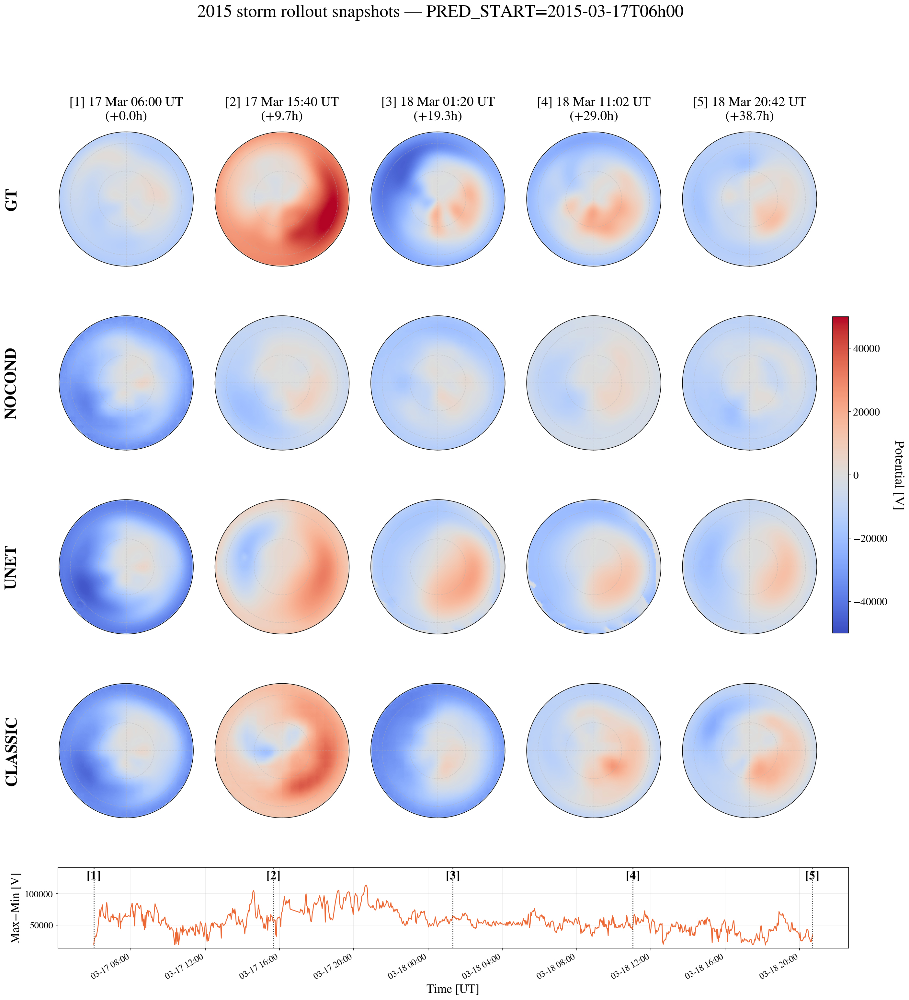

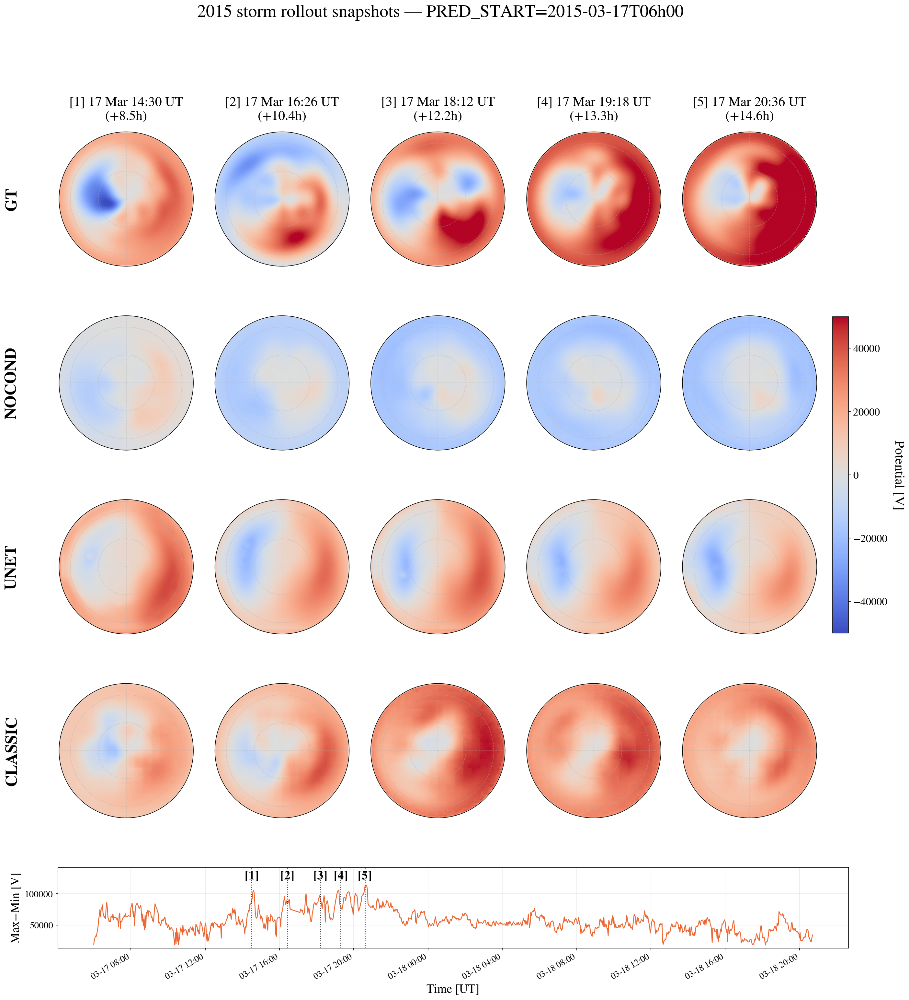

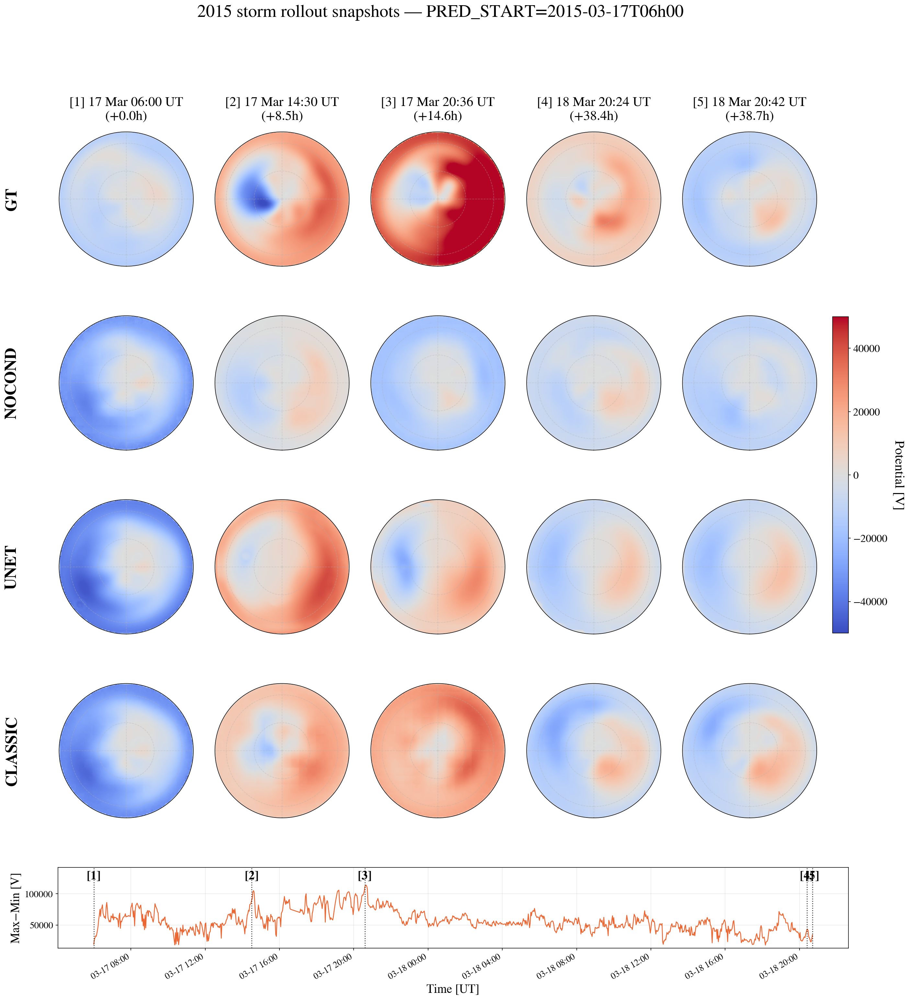

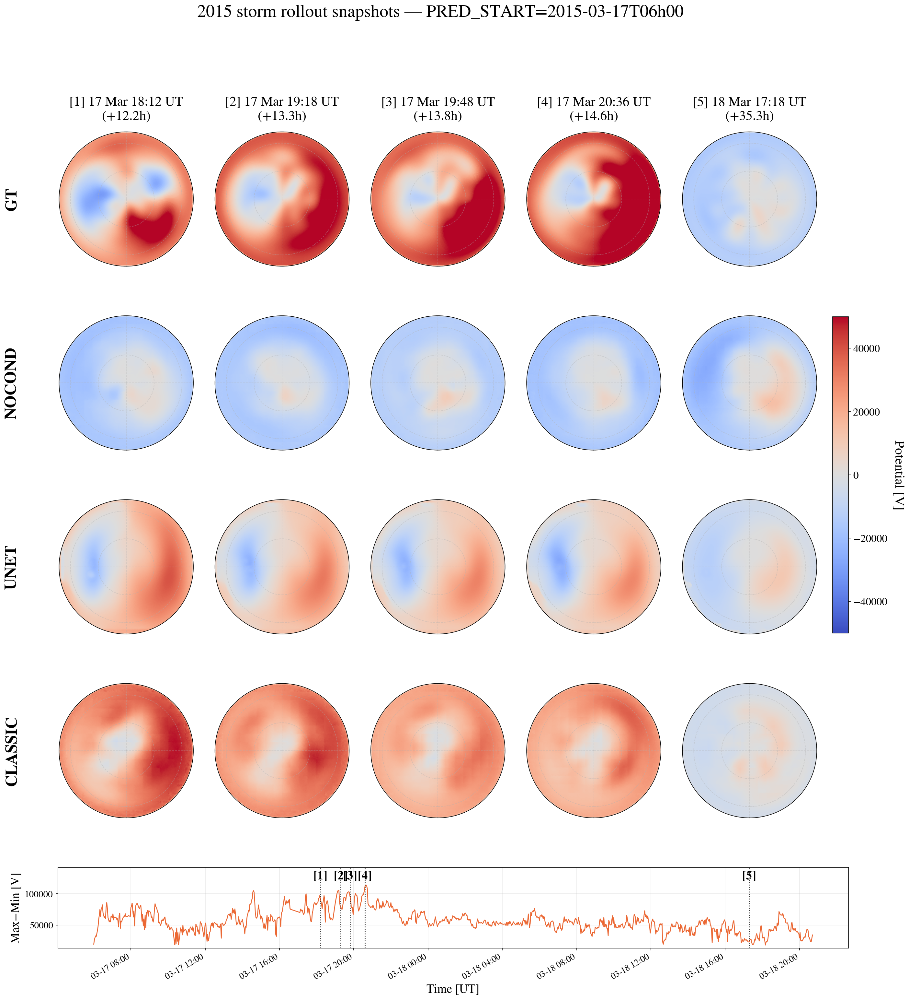

In [8]:
# =============================================================================
# Griglia GT / NOCOND / UNET / CLASSIC x 5 istanti futuri
# stessa trasformazione polare/colormap della GIF in explore_2015_timeseries.ipynb
# genera piu' varianti (diverse strategie di scelta delle colonne) per poter confrontare
# =============================================================================
from scipy.ndimage import map_coordinates
from scipy.signal import find_peaks
import sys
sys.path.insert(0, '/users/framunno/projects/ionosphere_diffusion')
from src.data.dataset import latlon_to_cartesian_grid

GRID_TAG   = '2015-03-17T06h00'   # finestra da mostrare -- cambia qui per un'altra finestra
N_COLS     = 5
SAMPLE_IDX = 0                     # quale sample diffusion mostrare per CLASSIC/NOCOND
VMAX       = 50000

def load_pred_maps(tag, model_name):
    d = f"{BASE}/results_2015_{model_name}_AR50_pred{tag}"
    pred = np.load(os.path.join(d, 'generated_imgs', 'pred_0.npy'), allow_pickle=True).astype(np.float32) * NORM_SCALE
    if pred.ndim == 3:
        pred = pred[np.newaxis]
    return pred   # (n_samples, T, H, W)

pred_start = pred_starts[GRID_TAG]
preds = {m: load_pred_maps(GRID_TAG, m) for m in ['NOCOND', 'UNET', 'CLASSIC']}
T_total = preds['CLASSIC'].shape[1]
rollout_times = [pred_start + pd.Timedelta(minutes=FRAME_DT * i) for i in range(T_total)]

# =============================================================================
# Strategie di scelta dei 5 istanti (colonne), usando i picchi/valli di "range" (cella 3,
# Figura 1) nella finestra del rollout scelto -- invece di semplice equispaziatura
# =============================================================================
window_mask = (stats.index >= rollout_times[0]) & (stats.index <= rollout_times[-1])
s_win = stats[window_mask]
smoothed = s_win['range'].rolling(15, center=True, min_periods=1).mean()  # ~30 min, smussa il rumore a 2 min

peaks_idx, _ = find_peaks(smoothed.values, distance=30)
dips_idx,  _ = find_peaks(-smoothed.values, distance=30)

def times_to_frames(times):
    """Converte una lista di timestamp nei frame_idx piu' vicini del rollout."""
    return sorted({int(np.argmin([abs((t - rt).total_seconds()) for rt in rollout_times])) for t in times})

FRAME_STRATEGIES = {}

# 1) equispaziata (baseline, quella gia' vista)
FRAME_STRATEGIES['evenly'] = list(np.linspace(0, T_total - 1, N_COLS).round().astype(int))

# 2) i 5 picchi (massimi locali di range) piu' pronunciati, in ordine temporale
top_peaks = peaks_idx[np.argsort(smoothed.values[peaks_idx])[::-1][:N_COLS]]
FRAME_STRATEGIES['peaks'] = times_to_frames(s_win.index[sorted(top_peaks)])

# 3) narrativa: inizio, picco in fase di crescita, picco massimo assoluto, valle in recovery, fine
narrative_times = [
    rollout_times[0],
    s_win.index[sorted(top_peaks)[0]] if len(top_peaks) else rollout_times[len(rollout_times)//4],
    s_win.index[peaks_idx[np.argmax(smoothed.values[peaks_idx])]],
    s_win.index[dips_idx[-1]] if len(dips_idx) else rollout_times[3*len(rollout_times)//4],
    rollout_times[-1],
]
FRAME_STRATEGIES['narrative'] = times_to_frames(narrative_times)

# 4) picchi + valli piu' estremi (massima deviazione dalla media della finestra)
all_extrema = np.concatenate([peaks_idx, dips_idx]) if len(dips_idx) else peaks_idx
dev = np.abs(smoothed.values[all_extrema] - smoothed.mean())
top_extrema = all_extrema[np.argsort(dev)[::-1][:N_COLS]]
FRAME_STRATEGIES['extremes'] = times_to_frames(s_win.index[sorted(top_extrema)])

for name, frames in FRAME_STRATEGIES.items():
    print(f"{name}: " + ", ".join(rollout_times[f].strftime('%d %b %H:%M') for f in frames))

def get_gt_frame_cart(t):
    idx = (df['time_map'] - t).abs().argmin()
    raw = np.load(os.path.join(MAPS_DIR, df.iloc[idx]['filename']), allow_pickle=True)[0].astype(np.float32)
    return latlon_to_cartesian_grid(raw, output_size=128)

# griglia polare (identica a quella della GIF)
H_IMG, max_r = 128, 24
r_i, th_i = np.linspace(0, max_r, 200), np.linspace(0, 2 * np.pi, 360)
r_grid, theta_grid = np.meshgrid(r_i, th_i)
polar_x, polar_y = r_grid * np.cos(theta_grid), r_grid * np.sin(theta_grid)
col_coords = (polar_x + max_r) / (2 * max_r) * (H_IMG - 1)
row_coords = (polar_y + max_r) / (2 * max_r) * (H_IMG - 1)

def to_polar(frame2d):
    return map_coordinates(frame2d, [row_coords, col_coords], order=1, mode='constant', cval=0)

ROWS = [('GT', None), ('NOCOND', preds['NOCOND']), ('UNET', preds['UNET']), ('CLASSIC', preds['CLASSIC'])]

def plot_frames_grid(strategy_name, col_frames):
    from matplotlib.gridspec import GridSpec
    col_times = [rollout_times[fi] for fi in col_frames]
    n_cols = len(col_frames)
    n_rows = len(ROWS)

    fig = plt.figure(figsize=(4.2 * n_cols, 4.6 * n_rows + 3.4), dpi=300)
    gs = GridSpec(n_rows + 1, n_cols, height_ratios=[1] * n_rows + [0.6], hspace=0.4, wspace=0.15, figure=fig)
    polar_axes = [[fig.add_subplot(gs[row, c], polar=True) for c in range(n_cols)] for row in range(n_rows)]

    im_last = None
    for row, (label, arr) in enumerate(ROWS):
        for c, fi in enumerate(col_frames):
            ax = polar_axes[row][c]
            frame = get_gt_frame_cart(col_times[c]) if arr is None else np.clip(arr[SAMPLE_IDX, fi], -3 * VMAX, 3 * VMAX)
            im_last = ax.pcolormesh(theta_grid, r_grid, to_polar(frame), shading='auto',
                                     cmap='coolwarm', vmin=-VMAX, vmax=VMAX)
            ax.set_theta_zero_location('S')
            ax.set_theta_direction(1)
            ax.grid(True, linestyle='--', alpha=0.4)
            ax.set_yticks([0, 10, 20])
            ax.set_yticklabels([])
            ax.set_xticks(np.radians([0, 90, 180, 270]))
            ax.set_xticklabels([])
            if row == 0:
                hrs = (col_times[c] - pred_start).total_seconds() / 3600
                ax.set_title(f'[{c + 1}] ' + col_times[c].strftime('%d %b %H:%M UT') + f'\n(+{hrs:.1f}h)', fontsize=20, pad=18)
            if c == 0:
                ax.text(-0.35, 0.5, label, transform=ax.transAxes, fontsize=24, fontweight='bold',
                        va='center', ha='center', rotation=90)

    cbar = fig.colorbar(im_last, ax=[a for row_axes in polar_axes for a in row_axes], fraction=0.02, pad=0.02)
    cbar.set_label('Potential [V]', fontsize=20, rotation=270, labelpad=25)
    cbar.ax.tick_params(labelsize=16)

    # --- riga extra: Max-Min (range) GT sulla finestra di rollout, con marker numerati per colonna ---
    ax_ts = fig.add_subplot(gs[n_rows, :])
    ax_ts.plot(s_win.index, s_win['range'], color='#eb6834', lw=1.3)
    ymax = s_win['range'].max()
    for c, fi in enumerate(col_frames):
        ax_ts.axvline(col_times[c], color='black', lw=1.3, ls=':', alpha=0.8)
        ax_ts.text(col_times[c], ymax * 1.05, f'[{c + 1}]', ha='center', va='bottom', fontsize=18, fontweight='bold')
    ax_ts.set_ylim(top=ymax * 1.25)
    ax_ts.set_ylabel('Max' + chr(0x2212) + 'Min [V]', fontsize=18)
    ax_ts.set_xlabel('Time [UT]', fontsize=18)
    ax_ts.tick_params(labelsize=14)
    ax_ts.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d %H:%M'))
    plt.setp(ax_ts.xaxis.get_majorticklabels(), rotation=30, ha='right', fontsize=13)
    ax_ts.grid(alpha=0.25)

    fig.suptitle(f'2015 storm rollout snapshots ' + chr(0x2014) + f' PRED_START={GRID_TAG}',
                 fontsize=26, y=1.0)
    fig.savefig(os.path.join(PAPER_FIGURES_DIR, f'storm2015_frames_grid_{strategy_name}.png'), bbox_inches='tight', dpi=300)
    show(fig, f'storm2015_frames_grid_{strategy_name}.png')

for name, frames in FRAME_STRATEGIES.items():
    plot_frames_grid(name, frames)


## Figura 3 &mdash; summary statistics

Metriche aggregate sull'intero rollout, per le tre finestre di predizione.


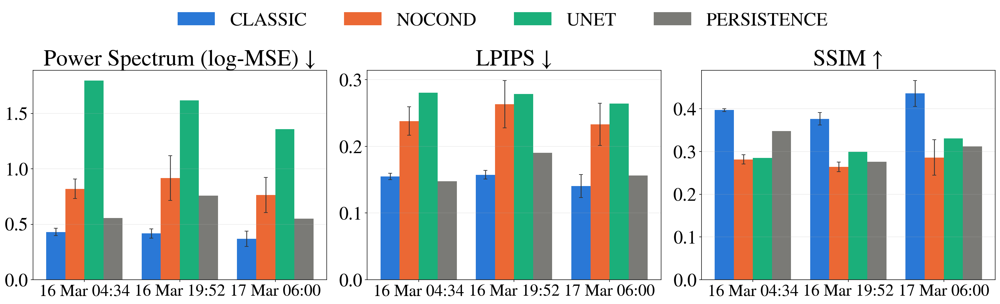

In [9]:
# =============================================================================
# Metriche pixel-wise / percettive (gia' calcolate su CSV precomputati)
# =============================================================================
df_2015_full = pd.read_csv(os.path.join(METRICS_BASE, 'metrics_per_frame_2015_with_baseline.csv'))

BAR_METRICS    = ['ps_log_mse', 'lpips', 'ssim']
METRIC_DISPLAY = {'ps_log_mse': 'Power Spectrum (log-MSE) ' + chr(0x2193),
                  'lpips': 'LPIPS ' + chr(0x2193), 'ssim': 'SSIM ' + chr(0x2191)}

per_sample_mean = df_2015_full.groupby(['pred_tag', 'model', 'sample_idx'])[BAR_METRICS].mean()
agg_all = per_sample_mean.groupby(['pred_tag', 'model']).mean()
agg_std = per_sample_mean.groupby(['pred_tag', 'model']).std().fillna(0.0)

TAG_SHORT_LABELS = [pd.Timestamp(t.replace('T', ' ').replace('h', ':')).strftime('%d %b %H:%M') for t in PRED_TAGS]

fig, axes = plt.subplots(1, len(BAR_METRICS), figsize=(7 * len(BAR_METRICS), 5.5), dpi=300)
x = np.arange(len(PRED_TAGS))
width = 0.8 / len(MODEL_ORDER)

for ax, metric in zip(axes, BAR_METRICS):
    for i, model_name in enumerate(MODEL_ORDER):
        vals = [agg_all.loc[(tag, model_name), metric] if (tag, model_name) in agg_all.index else np.nan for tag in PRED_TAGS]
        has_error_bar = model_name in ('CLASSIC', 'NOCOND')
        errs = ([agg_std.loc[(tag, model_name), metric] if (tag, model_name) in agg_std.index else 0.0 for tag in PRED_TAGS] if has_error_bar else None)
        offset = (i - (len(MODEL_ORDER) - 1) / 2) * width
        ax.bar(x + offset, vals, width, yerr=errs, capsize=3, error_kw={'linewidth': 1.2, 'ecolor': '#333333'},
               label=model_name, color=MODEL_COLORS[model_name])
        ax.tick_params(axis='y', labelsize=28)
    ax.set_xticks(x)
    ax.set_xticklabels(TAG_SHORT_LABELS, rotation=0, ha='center', fontsize=25)
    ax.set_title(METRIC_DISPLAY.get(metric, metric), fontsize=34)
    ax.grid(alpha=0.25, axis='y')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.18), ncol=len(MODEL_ORDER), fontsize=28, frameon=False)
plt.tight_layout()
fig.savefig(os.path.join(PAPER_FIGURES_DIR, 'storm2015_bar_metrics_overall.png'), bbox_inches='tight', dpi=300)
show(fig, '2015_fig3a_bar.png')


Su tutte e tre le metriche pixel-wise/percettive, **CLASSIC batte sistematicamente gli altri modelli**
in tutte e 3 le finestre &mdash; incluso il baseline di persistenza, che pure e' competitivo (batte
NOCOND e UNET su LPIPS e power spectrum in quasi tutte le finestre). E' un segnale forte: NOCOND e
UNET, pur avendo talvolta un errore scalare (mean/range) comparabile a CLASSIC, producono mappe che si
discostano percettivamente/spettralmente dalla GT piu' di quanto farebbe il semplice "congelare
l'ultimo frame osservato". UNET in particolare paga il prezzo dello smoothing evidenziato in Figura 2:
il suo power-spectrum log-MSE e' 3&ndash;4 volte peggiore di CLASSIC, coerente con la perdita di
struttura ad alta frequenza. Da notare che il vantaggio di CLASSIC su SSIM e' piu' marcato proprio
nella finestra 17 marzo 06:00 (0.44 contro 0.28&ndash;0.31 degli altri) &mdash; cresce esattamente
quando la tempesta e' piu' intensa e la generalizzazione e' piu' difficile.


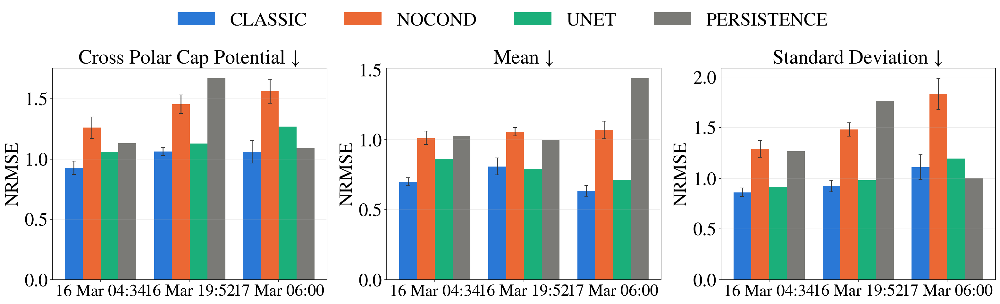

In [10]:
# =============================================================================
# NRMSE delle timeseries scalari (cpcp / mean / std), rollout completo
# =============================================================================
ts_df = pd.read_csv(os.path.join(METRICS_BASE, 'scalar_timeseries_2015.csv'))
ts_df['time'] = pd.to_datetime(ts_df['time'], utc=True)

NRMSE_STATS = ['cpcp', 'mean', 'std']
NRMSE_NAMES = {'cpcp': 'Cross Polar Cap Potential ' + chr(0x2193), 'mean': 'Mean ' + chr(0x2193),
               'std': 'Standard Deviation ' + chr(0x2193)}

def per_sample_nrmse(tag, model_name, stat):
    gt_by_time = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT')].set_index('time')[stat]
    pred_sub = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['model'] == model_name)]
    nrmses = []
    for sidx in sorted(pred_sub['sample_idx'].unique()):
        p_by_time = pred_sub[pred_sub['sample_idx'] == sidx].set_index('time')[stat]
        common = gt_by_time.index.intersection(p_by_time.index)
        if len(common) < 2:
            continue
        g = gt_by_time.loc[common].values.astype(np.float64)
        p = p_by_time.loc[common].values.astype(np.float64)
        rmse = float(np.sqrt(np.mean((g - p) ** 2)))
        nrmses.append(rmse / (g.std() + 1e-8))
    return nrmses

nrmse_mean, nrmse_std = {}, {}
for tag in PRED_TAGS:
    for model_name in ['CLASSIC', 'NOCOND', 'UNET']:
        for stat in NRMSE_STATS:
            vals = per_sample_nrmse(tag, model_name, stat)
            nrmse_mean[(tag, model_name, stat)] = float(np.mean(vals)) if vals else np.nan
            nrmse_std[(tag, model_name, stat)]  = float(np.std(vals)) if len(vals) > 1 else 0.0

# Persistenza: ultimo frame di conditioning ripetuto costante, confrontato con la GT
for tag in PRED_TAGS:
    gt_by_time = ts_df[(ts_df['pred_tag'] == tag) & (ts_df['series'] == 'GT')].set_index('time')
    pred_start_tag = gt_by_time.index.min()
    persisted_row = stats.iloc[stats.index.get_indexer([pred_start_tag - pd.Timedelta(minutes=FRAME_DT)], method='nearest')]
    for stat in NRMSE_STATS:
        g = gt_by_time[stat].values.astype(np.float64)
        p = np.full_like(g, float(persisted_row[stat].iloc[0]))
        rmse = float(np.sqrt(np.mean((g - p) ** 2)))
        nrmse_mean[(tag, 'PERSISTENCE', stat)] = float(rmse / (g.std() + 1e-8))
        nrmse_std[(tag, 'PERSISTENCE', stat)]  = 0.0

fig, axes = plt.subplots(1, len(NRMSE_STATS), figsize=(7 * len(NRMSE_STATS), 5.5), dpi=300)
x = np.arange(len(PRED_TAGS))
width = 0.8 / len(MODEL_ORDER)

for ax, stat in zip(axes, NRMSE_STATS):
    for i, model_name in enumerate(MODEL_ORDER):
        vals = [nrmse_mean.get((tag, model_name, stat), np.nan) for tag in PRED_TAGS]
        has_error_bar = model_name in ('CLASSIC', 'NOCOND')
        errs = ([nrmse_std.get((tag, model_name, stat), 0.0) for tag in PRED_TAGS] if has_error_bar else None)
        offset = (i - (len(MODEL_ORDER) - 1) / 2) * width
        ax.bar(x + offset, vals, width, yerr=errs, capsize=3, error_kw={'linewidth': 1.2, 'ecolor': '#333333'},
               label=model_name, color=MODEL_COLORS[model_name])
        ax.tick_params(axis='y', labelsize=28)
    ax.set_ylabel('NRMSE', fontsize=28)
    ax.set_xticks(x)
    ax.set_xticklabels(TAG_SHORT_LABELS, rotation=0, ha='center', fontsize=25)
    ax.set_title(NRMSE_NAMES.get(stat, stat), fontsize=30)
    ax.grid(alpha=0.25, axis='y')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.18), ncol=len(MODEL_ORDER), fontsize=28, frameon=False)
plt.tight_layout()
fig.savefig(os.path.join(PAPER_FIGURES_DIR, 'storm2015_nrmse_overall.png'), bbox_inches='tight', dpi=300)
show(fig, '2015_fig3b_nrmse.png')


Le NRMSE calcolate sull'intero rollout (fino a ~2.5 giorni) confermano il quadro: **CLASSIC ha
l'errore piu' basso o quasi** su cross polar cap potential e mean in tutte le finestre, con **NOCOND
sistematicamente il peggiore** (NRMSE fino a 1.8 sulla std, cioe' peggio che predire una costante).
UNET e' competitivo sulla mean (a volte leggermente meglio di CLASSIC, coerente col fatto che tende a
una traiettoria liscia vicina alla media di lungo periodo) ma resta indietro su std e cpcp &mdash; la
sua "cecita'" alla variabilita' pesa qui. Da notare che, a differenza delle metriche pixel-wise sopra,
qui tutti i modelli hanno NRMSE vicino o sopra 1 su orizzonti cosi' lunghi: un rollout di 2+ giorni
resta un compito difficile per tutti, ma CLASSIC degrada meno degli altri.
